# Рынок общественного питания Москвы

Инвесторы решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  

**Цель исследования:**  
Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Ход исследования:**
В моем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Исследование условно разделено на две части, в первой части которого я проанализирую рынок общественного питания Москвы и выявлю некоторые особенности, а во второй части детализирую исследование и дам рекомендации относительно открытия заведения определенной категории. Мой анализ будет состоять из этапов:
1. Изучение общей информации
2. Предобработка данных
3. Анализ данных
4. Детализированное исследование
5. Подготовка презентации для инвесторов
6. Общие выводы

In [1]:
# Импорт необходимых библитек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MultipleLocator
import plotly.express as px

In [2]:
# Библиотеки для создания карт
from folium import Map, Choropleth, Marker
import json
from folium.plugins import MarkerCluster

## Изучение общей информации

In [3]:
# Прочитаем датасет и выведем первые 5 строк
df = pd.read_csv('C:/Users/user/anaconda3/datasets/moscow_places.csv') # располжение на моем ПК
    
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
# Изучим общую информацию о датасете и типе данных
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
# Посмотрим сколько уникальных названий заведений
df['name'].nunique()

5614

На данном этапе можно сказать, что уникальных названий заведений 5614, а всего в датасете 8406. Необходимо проверить имеются ли дубликаты в данных, или же это все из-за сетевых заведений.

In [6]:
# Посмотрим на наличие явных дубликатов
df.duplicated().sum()

0

In [7]:
# Посмотрим есть ли явные дубликаты по названию и адресу
df[['name', 'address']].duplicated().sum()

0

In [8]:
# Проверим на наличие неявных дубликатов в названиях заведений
df['name_new'] = df['name'].str.lower().str.replace(' ', '')
df[['name_new', 'address']].duplicated().sum()

4

In [9]:
# Изучим их подробнее
df[df[['name_new', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_new
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,morepoke
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,morepoke
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,раковарняклешниихвосты
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,раковарняклешниихвосты
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,хлебдавыпечка
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,хлебдавыпечка
4613,Cafe 13,кафе,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–19:00,55.762779,37.633079,4.3,NaN,NaN,NaN,NaN,0,200.0,cafe13
4780,Cafe13,ресторан,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–18:00,55.762748,37.633176,4.3,NaN,NaN,NaN,NaN,0,200.0,cafe13


Найдено 4 неявных дубликата. Мы видим, что могут различаться категория заведения и часы работы, а в остальном эти строки идентичны, следовательно, это одно и то же заведение. Вторую строку дубликат стоит удалить.

In [10]:
df = df.drop_duplicates(subset=['name_new', 'address'], ignore_index=True)
df = df.drop(columns='name_new')

Теперь можно точно сказать, что дубликатов в датасете нет, мы имеем дело с единичными заведениями и сетевыми. Изучим сколько их.

In [11]:
print(f"Несетевых заведений: {df.query('chain == 0')['name'].count()}")
print(f"Cетевых заведений: {df.query('chain == 1')['name'].count()}")

Несетевых заведений: 5199
Cетевых заведений: 3203


In [12]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [13]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

В нашем датасете представлено 5199 несетевых заведений и 3203 сетевых. О столбцах датасета можно сказать следующее:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения ('кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая');
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении ('высокие', 'выше среднего', 'средние', 'низкие');
- `avg_bill` — хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
0 — заведение не является сетевым  
1 — заведение является сетевым  
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.  
Типы данных в столбцах позволяют проводить дальнейшее исследование.

**Вывод:** Мы изучили общую информацию о датасете. В нем представлено 8402 заведения, из них 5199 несетевых заведений и 3203 сетевых. Необходимо совершить предобработку данных. Затем они позволят проводить исследование рынка общественного питания в Москве.

## Предобработка данных

Мы уже выяснили, что явных дубликатов в данных нет и удалили неявные дубликаты. Есть пропуски в столбцах:
- `hours` - 536 заведений (6%) не имеют данных о режиме работы, пропуски заполнить не представляется возможным, но это существенно не повлияет на результаты исследования;
- `price` - 5091 заведение (61%) имеют пропуски в столбце с категориями цен, пропуски не заполнить, проводить исследования стоит без этих данных;
- `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` - более 50% заведений не имеют информации о средней стоимости заказа и заполнить их мы не сможем, поэтому стоит учитывать, что метрики рассчитанные на основе этих столбцов нельзя назвать достоверными, однако примерные значения рассчитать мы все же можем;
- `seats` - 3611 заведений (43%) не имеют информации о количестве посадочных мест, заполнить нельзя, поэтому исследование количества посадочных мест также нельзя назвать достоверным. 

In [14]:
# Создадим столбец  'street' с названиями улиц из столбца с адресом
df['street'] = df['address'].apply(lambda x: x.split(',')[1])

In [15]:
# Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно') == True

In [16]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


**Вывод:** В результате предобработки данных мы выяснили, что явных дубликатов в данных нет, неявные удалены, но есть пропуски. Пропусков в столбцах `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats` достаточно много и заполнить их не представляется возможным, удаление или изменение приведет к искажению данных. При рассчитывании метрик по данным столбцам стоит осторожно делать выводы с поправкой на неполноту данных.

## Анализ данных

### Категории заведений

In [17]:
# Подготовим данные для визуализации
df_category = pd.DataFrame(df['category'].value_counts().reset_index())
df_category

,index,category
0,кафе,2377
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


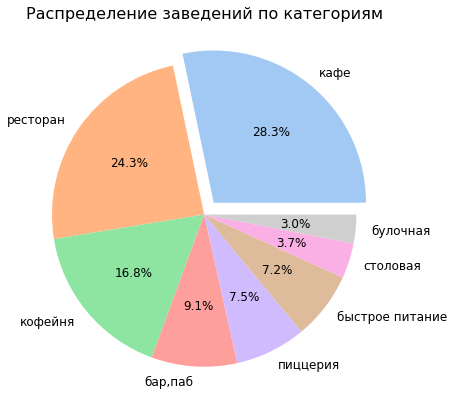

In [18]:
fig, ax = plt.subplots(figsize=(7,7))
colors = sns.color_palette('pastel', 8)
ax.pie(x=df_category['category'],
       labels=df_category['index'],
       autopct='%1.1f%%',
       explode = [0.1] + [0 for _ in range(len(df_category['index']) - 1)],
       colors=colors,
       textprops={'fontsize': 12})
plt.title('Распределение заведений по категориям', fontsize=16)
plt.show()

Больше всего заведений в Москве относятся к категории кафе (28,3%) и рестораны (24,3%). На третьем месте кофейни (16,8%). Меньше всего булочных и столовых (3,0% и 3,7% соответственно).

### Количество посадочных мест по категориям заведений

In [19]:
# Посчитаем медианное количество посадочных мест по категориям заведений
df_seats = (
    df.groupby('category', as_index=False)['seats']
    .median()
    .round()
    .sort_values('seats', ascending=False, ignore_index=True)
)
df_seats

,category,seats
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,76.0
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


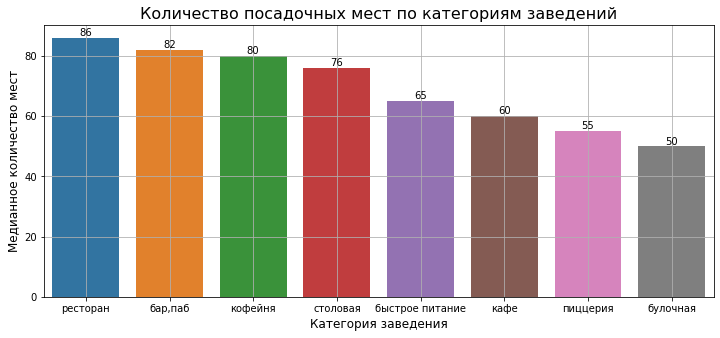

In [20]:
# Постороим визуализацию
fig, ax = plt.subplots(figsize=(12, 5))
ax = sns.barplot(x='category',
                 y='seats',
                 data=df_seats)
plt.title('Количество посадочных мест по категориям заведений', fontsize=16)
plt.xlabel('Категория заведения', fontsize=12)
ax.bar_label(ax.containers[0])
plt.ylabel('Медианное количество мест', fontsize=12)
plt.grid()
plt.show()

Можно сделать вывод, что в среднем больше всего посадочных в ресторанах, барах-пабах и кофейнях (> 80 мест). Меньше всего посадочных мест в кафе, пиццериях и булочных (<= 60 мест).

### Cоотношение сетевых и несетевых заведений

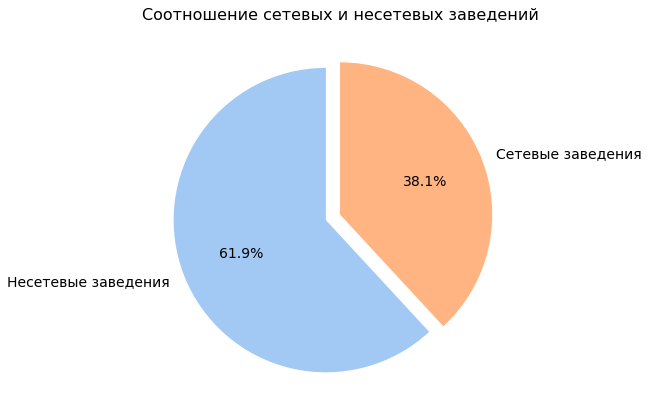

In [21]:
fig, ax = plt.subplots(figsize=(7,7))
ax.pie(x=df['chain'].value_counts(),
       labels=['Несетевые заведения', 'Сетевые заведения'],
       autopct='%1.1f%%',
       colors=colors,
       explode = [0.1] + [0 for _ in range(len(df['chain'].value_counts()) - 1)],
       textprops={'fontsize': 14},
       startangle=90)
plt.title('Cоотношение сетевых и несетевых заведений', fontsize=16)
plt.show()

Больше всего в Москве все-таки  несетевых заведений - 62%.

### Категории заведений, которые чаще являются сетевыми

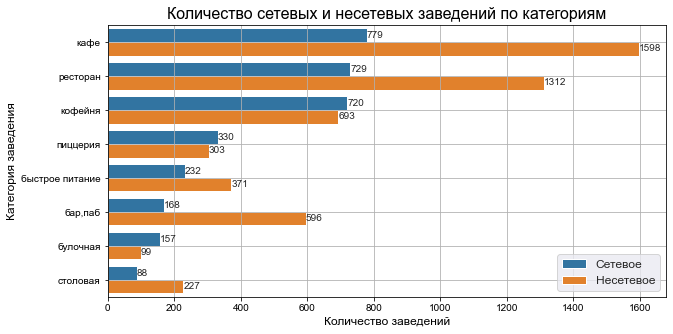

In [22]:
# Подготовим сводную таблицу с количеством сетевых и несетевых заведений в разбивке по категориям
df_chain_category = (
    df.groupby(['chain', 'category'], as_index=False)['name']
    .count()
    .sort_values(by=['chain', 'name'], ascending=False, ignore_index=True)
)

# Если 'chain' равно 0, то заведение несетевое и наоборот
df_chain_category['chain'] = df_chain_category['chain'].apply(lambda x: 'Несетевое' if x == 0 else 'Сетевое')

# Построим визуализацию
fig, ax = plt.subplots(figsize=(10, 5))
sns.set_style('dark')
ax = sns.barplot(x='name', y='category', data=df_chain_category, hue='chain')
plt.title('Количество сетевых и несетевых заведений по категориям', fontsize=16)
plt.xlabel('Количество заведений', fontsize=12)
for container in ax.containers:
    df_hue = df_chain_category.loc[df_chain_category['category']==container.get_label()]
    ax.bar_label(container, labels=df_hue['name'])
plt.ylabel('Категория заведения', fontsize=12)
plt.legend(loc='lower right', fontsize=12)
plt.grid()
plt.show()

1. Больше всего `сетевых` заведений можно встретить в категориях `кафе, рестораны и кофейни`. Это можно объяснить тем, что эти категории являются самыми популярными в Москве. При этом стоит заметить, что `несетевых` кафе и ресторанов в 2 раза больше, чем сетевых.
2. `Булочные, пиццерии и кофейни` чаще являются сетевыми, чем несетевыми заведениями.

### Топ-15 популярных сетей в Москве

In [23]:
# Подготовим данные
df_chain_popular = df.query("chain == 1")['name'].value_counts().reset_index().head(15)
df_chain_popular.columns = ['name', 'count']
df_chain_popular =(
    df_chain_popular.merge(df[['name','category']], on='name', how='inner')
    .groupby(['name', 'count'], as_index=False)
    .agg({'category':'first'})
    .sort_values('count', ascending=False, ignore_index=True)
)

In [31]:
df_chain_popular['name'] = df_chain_popular['name'].replace({'Кулинарная лавка братьев Караваевых': 'КЛ братьев Караваевых'})

# Построим визуализацию
#fig = px.bar(df_chain_popular,
#             x='name', 
#             y='count',
#             text='count',
#             color='category')
#fig.update_layout(title='Топ-15 популярных сетей в Москве',
#                  xaxis_title='Название сети заведений',
#                  yaxis_title='Количество заведений')
#fig.show()

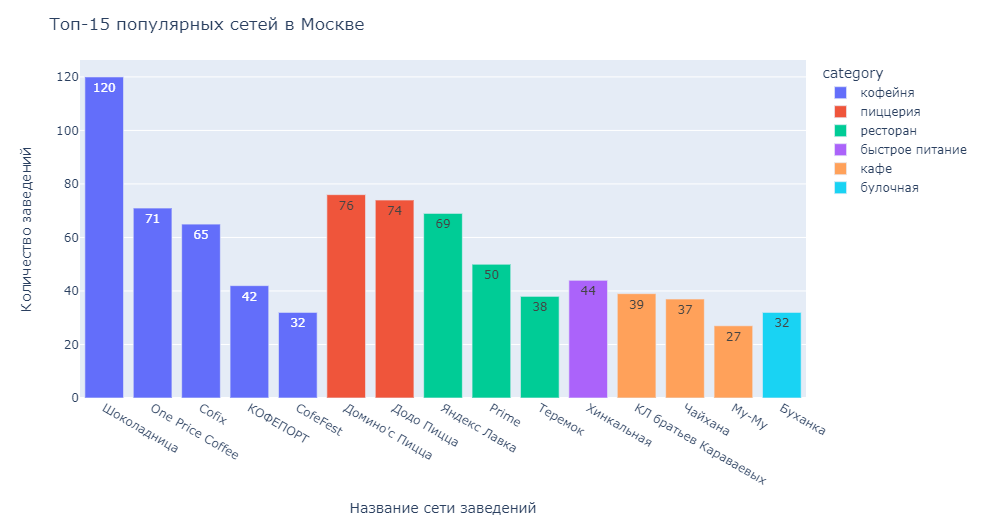

Мы определили топ-15 популярных сетей в Москве, и, действительно, в топ-3 попали такие широкоизвестные завдения как `Шоколадница`, `Домино'с Пицца` и `Додо Пицца`.  
Изучив топ популярных сетей можно с уверенностью сказать, что самые успешные сети - это `кофейни и пиццерии`.

### Количество заведений по административным районам Москвы

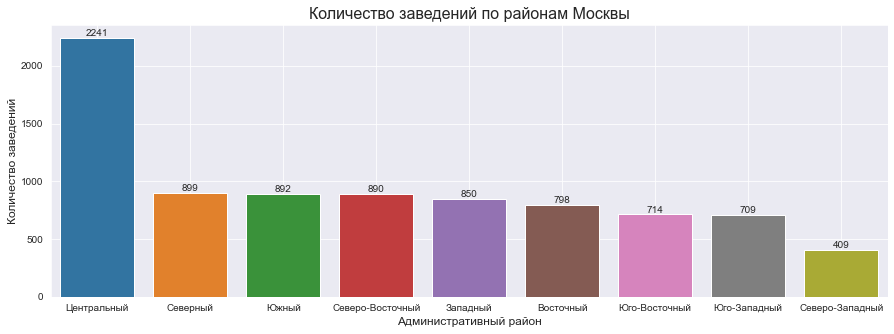

In [30]:
# Подготовим данные с количеством заведений по районам
df_district = df['district'].value_counts().reset_index()
df_district.columns = ('district', 'count')
df_district['district'] = df_district['district'].apply(lambda x: x.split(' ')[0])

# Постороим визуализацию
fig, ax = plt.subplots(figsize=(15, 5))
ax = sns.barplot(x='district',
                 y='count',
                 data=df_district)
plt.title('Количество заведений по районам Москвы', fontsize=16)
plt.xlabel('Административный район', fontsize=12)
ax.bar_label(ax.containers[0])
plt.ylabel('Количество заведений', fontsize=12)
plt.grid()
plt.show()

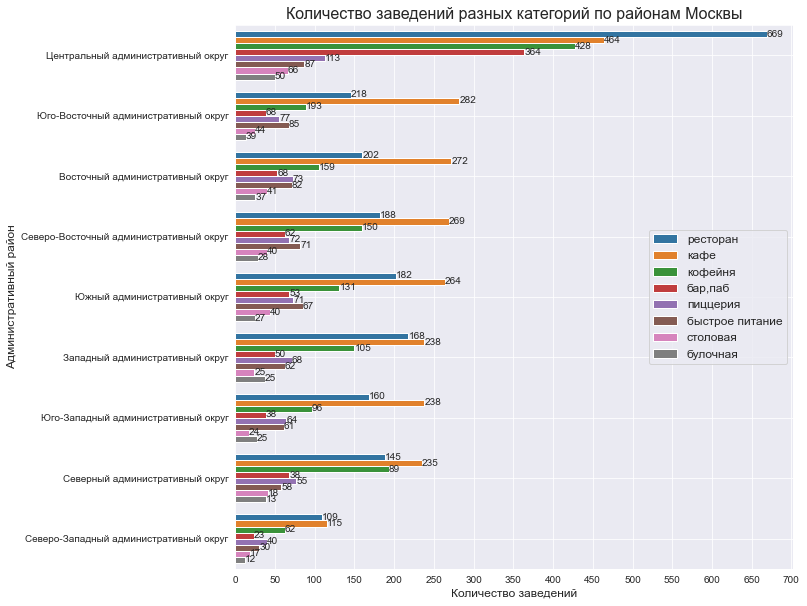

In [26]:
# Подготовим данные с количеством заведений по районам в разбивке по категориям
df_district_category = (
    df.groupby(['district', 'category'], as_index=False)['name']
    .count()
    .sort_values('name', ascending=False, ignore_index=True)
)

# Построим визуализацию
fig, ax = plt.subplots(figsize=(10, 10))
sns.set_style('dark')
ax = sns.barplot(x='name', y='district', data=df_district_category, hue='category')
plt.title('Количество заведений разных категорий по районам Москвы', fontsize=16)
plt.xlabel('Количество заведений', fontsize=12)
ax.xaxis.set_major_locator(MultipleLocator(50))
for container in ax.containers:
    df_hue = df_district_category.loc[df_district_category['category']==container.get_label()]
    ax.bar_label(container, labels=df_hue['name'])
plt.ylabel('Административный район', fontsize=12)
plt.legend(loc='center right', fontsize=12)
plt.grid()
plt.show()

1. Больше всего заведений в `Центральном административном округе` (2241 заведение). В остальных районах завдений в 2-3 раза меньше, от 700 до 900 заведений. Меньше всего в  `Северо-Западном` - 409 заведений.
2. Можно сказать, что `рестораны` на первом месте по популярности только в `Центральном административном округе`. В остальных районах на первом месте `кафе` и только потом рестораны. `Кофейни` стабильно находятся на третьем месте во всех округах Москвы.

### Распределение средних рейтингов по категориям заведений

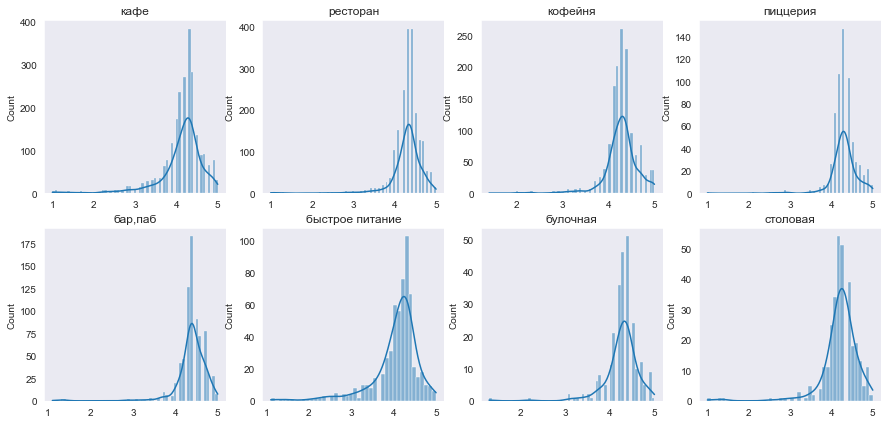

In [27]:
# Посмотрим как распределены рейтинги заведений по каждой категории
plt.figure(figsize=(15, 7))

for i, category in enumerate(df['category'].unique()):
    sns.histplot(x='rating', data=df.query('category == @category'), kde=True, ax=plt.subplot(2, 4, i + 1))
    plt.xlabel(' ')
    plt.title('{}'.format(category))
plt.show()

Мы имеем распределение рейтингов близкое к нормальному. Могут наблюдаться выбросы, поэтому в качестве описательной статисктики стоит выбрать медиану и построить boxplot.

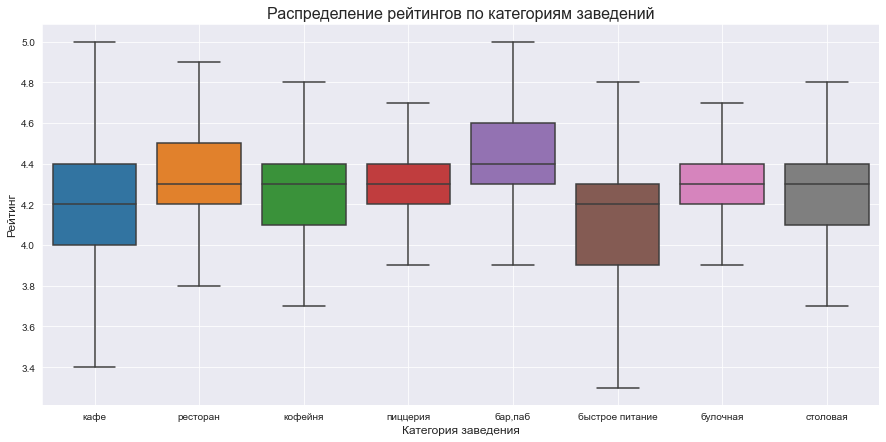

In [28]:
# Визуализируем распределение средних рейтингов по категориям заведений
fig, ax = plt.subplots(figsize=(15, 7))
ax = sns.boxplot(x='category', y='rating', data=df, showfliers=False)
plt.title('Распределение рейтингов по категориям заведений', fontsize=16)
plt.xlabel('Категория заведения', fontsize=12)
plt.ylabel('Рейтинг', fontsize=12)
ax.yaxis.set_major_locator(MultipleLocator(0.2))
plt.grid()
plt.show()

1. Можно сказать, что средние рейтинги по категориям заведений несильно различаются.  
2. Следует выделить категорию`бар,паб` с самой высокой средней оценкой 4,4. `Кафе` и `быстрое питание` имеют среднюю оценку 4,2, все остальные категории 4,3.  
3. Исходя из распределения рейтингов, можно сказать, что `кафе, рестораны, кофейни и быстрое питание` имеют намного больше отрицательных оценок (меньше 3.0). Это можно объяснить большим количеством заведений в категориях `кафе, рестораны и кофейни.`  
4. `Быстрое питание` же не является такой популярной категорией, отсюда следует вывод, что данная категория больше всего подвержена отрицательным отзывам.

### Фоновую картограмма (хороплет) со средним рейтингом заведений каждого района

In [29]:
# Как мы выяснили ранее рейтинг следует сравнивать по медиане
df_district_rating = df.groupby('district', as_index=False)['rating'].agg('median')

In [30]:
# читаем файл и сохраняем в переменной
with open('C:/Users/user/anaconda3/datasets/admin_level_geomap.geojson', 'r', encoding='utf8') as f:   #ПК
        state_geo = json.load(f)


In [31]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
#Choropleth(
#    geo_data=state_geo,
#    data=df_district_rating,
#    columns=['district', 'rating'],
#    key_on='feature.name',
#    fill_color='YlGn',
#    fill_opacity=0.8,
#    legend_name='Медианный рейтинг заведения',
#).add_to(m)

# выводим карту
#m

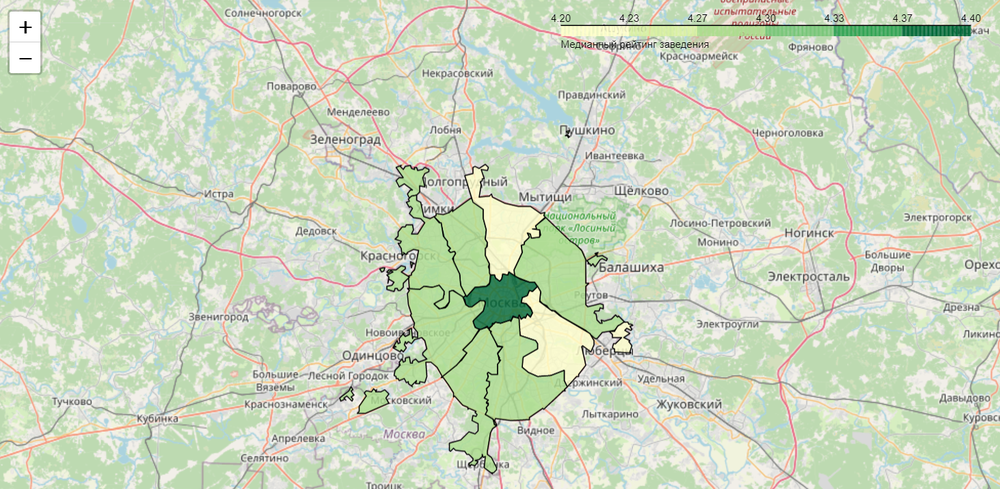

**Вывод:** На хороплете с медианным рейтингом заведений по районам Москвы наглядно видно , что в центре города заведения получают рейтинг выше, `Центральный АО` - самый высокий рейтинг (4,4). Самый низкий рейтинг на севере и юго-востоке Москвы, `Северо-Восточный АО` и `Юго-Восточный АО` имеют средний рейтинг (4,2). Рейтинг заведений в других районах установился на отметке 4,3. 

###  Все заведения на карте

In [32]:
# создаём новую карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
# df.apply(create_clusters, axis=1)

# выводим карту
# m

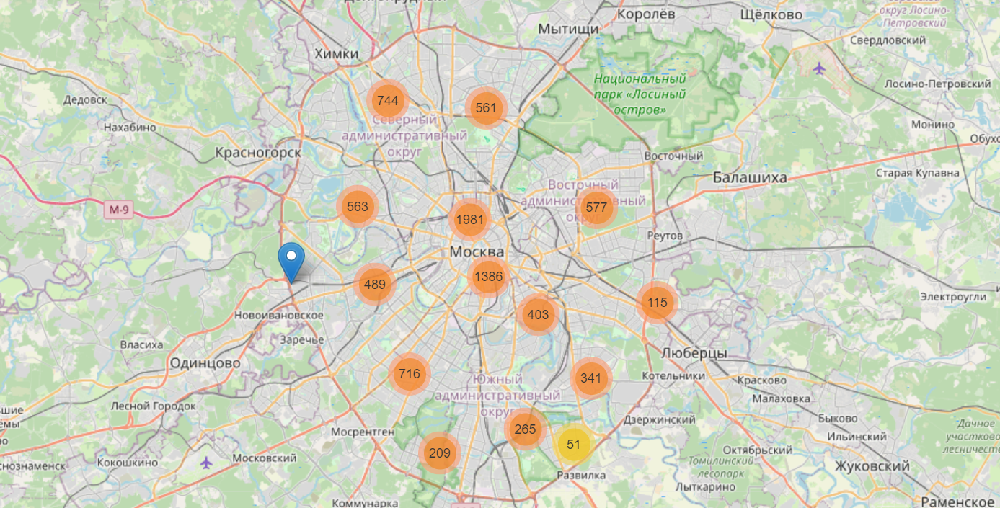

**Вывод:** По карте также наглядно видно, что наибольшее количество заведений концетрируется в центре Москвы, на юге и востоке столицы наоборот заведений достаточно мало.

### Топ-15 улиц по количеству заведений

In [33]:
# Найдем топ-15 улиц по количеству заведений
df_street_top = (
    df.groupby('street', as_index=False)['name']
    .agg('count')
    .sort_values('name', ascending=False, ignore_index=True).head(15)
)
df_street_top

,street,name
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [34]:
# Подготовим данные по количеству заведений в разбивке по улицам и категориям
top_streets = list(df_street_top['street'])
df_street_category = df.query('street in @top_streets').groupby(['street', 'category'], as_index=False)['name'].agg('count')
df_street_category['sum'] = df_street_category.groupby('street')['name'].transform('sum')
df_street_category = df_street_category.sort_values(['sum','name'], ascending=False)

# Построим визуализацию
#fig = px.bar(df_street_category,
#             x='street', 
#             y= 'name',
#             text='name',
#             color='category')
#fig.update_layout(title='Топ-15 улиц по количеству заведений',
#                  xaxis_title='Улица',
#                  yaxis_title='Количество заведений',
#                  legend_title='Категория заведения')
#fig.show()

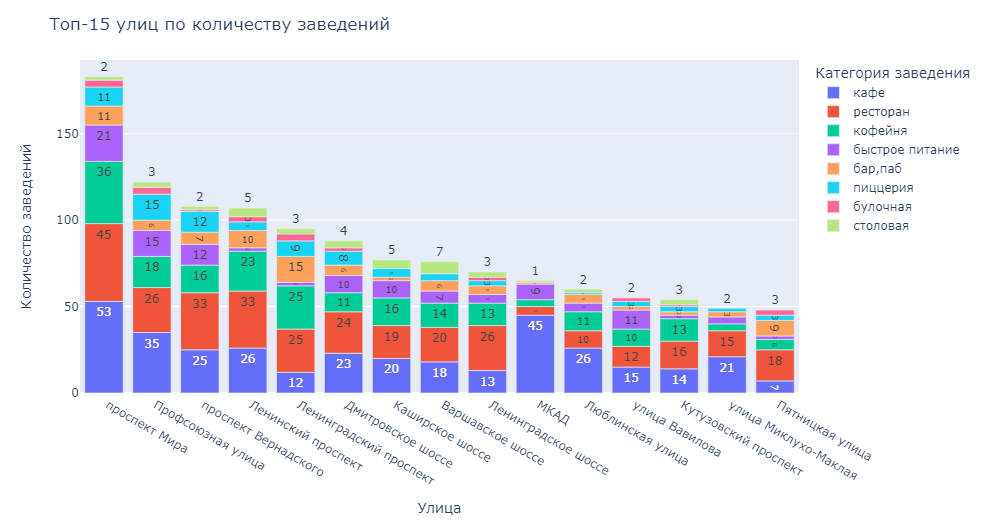

**Вывод:** 
1. Мы определили топ-15 улиц по количеству заведений, больше всего заведений на `проспекте Мира` (182), далее с заметным отставанием `Профсоюзная улица` (122), `проспект Вернадского` (108) и `Ленинский проспект`(107).
2. На `проспекте Мира` и `Профсоюзной улице` больше кафе, чем ресторанов.
3. На `проспекте Вернадского` и `Ленинском проспекте` же наоборот главенствуют рестораны.
4. Большое количество кафе находится на `МКАДе` (45).
5. На `Ленинградском проспекете` больше всего баров-пабов (15).

### Улицы, на которых находится только один объект общепита

In [35]:
# Создадим датафрейм с такими заведениямии
sreets_one_place = list(df.groupby('street', as_index=False).agg({'name':'count'}).query('name == 1')['street'])
df_one_place = df.query('street in @sreets_one_place')

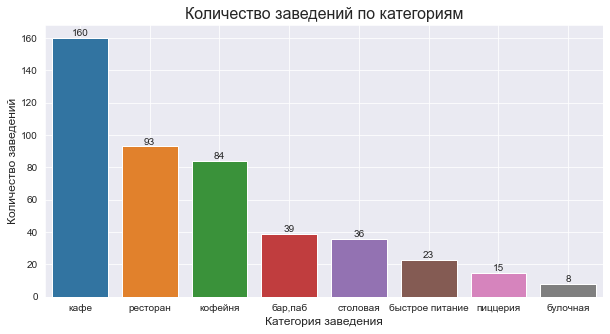

In [36]:
# Изучим такие заведения подробнее
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x='index',
                 y='category',
                 data=df_one_place['category'].value_counts().reset_index())
plt.title('Количество заведений по категориям', fontsize=16)
plt.xlabel('Категория заведения', fontsize=12)
ax.bar_label(ax.containers[0])
plt.ylabel('Количество заведений', fontsize=12)
plt.grid()
plt.show()

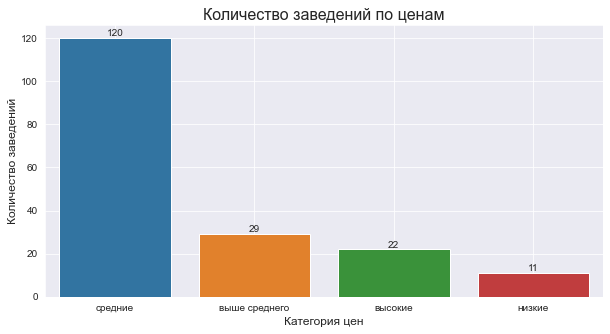

In [37]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x='index',
                 y='price',
                 data=df_one_place['price'].value_counts().reset_index())
plt.title('Количество заведений по ценам', fontsize=16)
plt.xlabel('Категория цен', fontsize=12)
ax.bar_label(ax.containers[0])
plt.ylabel('Количество заведений', fontsize=12)
plt.grid()
plt.show()

In [38]:
df_one_place['seats'].describe()

count    156.000000
mean      59.115385
std       48.274880
min        0.000000
25%       30.000000
50%       45.000000
75%       80.000000
max      240.000000
Name: seats, dtype: float64

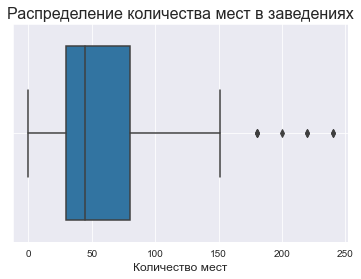

In [39]:
fig, ax = plt.subplots()
ax = sns.boxplot(x='seats', data=df_one_place)
plt.title('Распределение количества мест в заведениях', fontsize=16)
plt.xlabel('Количество мест', fontsize=12)
plt.grid()
plt.show()

In [40]:
df_one_place['middle_avg_bill'].describe()

count     165.000000
mean      959.830303
std       999.518083
min        67.000000
25%       325.000000
50%       625.000000
75%      1250.000000
max      7000.000000
Name: middle_avg_bill, dtype: float64

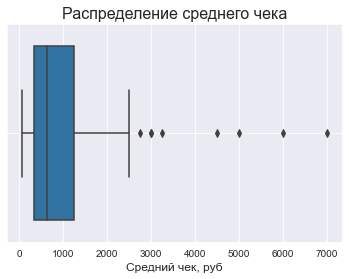

In [41]:
fig, ax = plt.subplots()
ax = sns.boxplot(x='middle_avg_bill', data=df_one_place)
plt.title('Распределение среднего чека', fontsize=16)
plt.xlabel('Средний чек, руб', fontsize=12)
plt.grid()
plt.show()

**Вывод:** Итак, можно сказать, что если на улице находится лишь одно заведение, в большинстве случаев это будет кафе (в 2 раза меньше вероятность, что это будет ресторан или кофейня) со средней категорией цен, вместимостью 30-80 человек и со средним чеком в 625 рублей.

### Фоновая картограмма (хороплет) со средними чеками для каждого района

In [42]:
# Посчитаем медиану средний чек по районам Москвы
df_district_bill = (
    df.groupby('district', as_index=False)['middle_avg_bill']
    .agg('median')
    .sort_values('middle_avg_bill', ignore_index=True, ascending=False)
)
df_district_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
#Choropleth(
#    geo_data=state_geo,
#    data=df_district_bill,
#    columns=['district', 'middle_avg_bill'],
#    key_on='feature.name',
#    fill_color='YlOrRd',
#    fill_opacity=0.8,
#    legend_name='Средний чек, руб',
#).add_to(m)

# выводим карту
#m

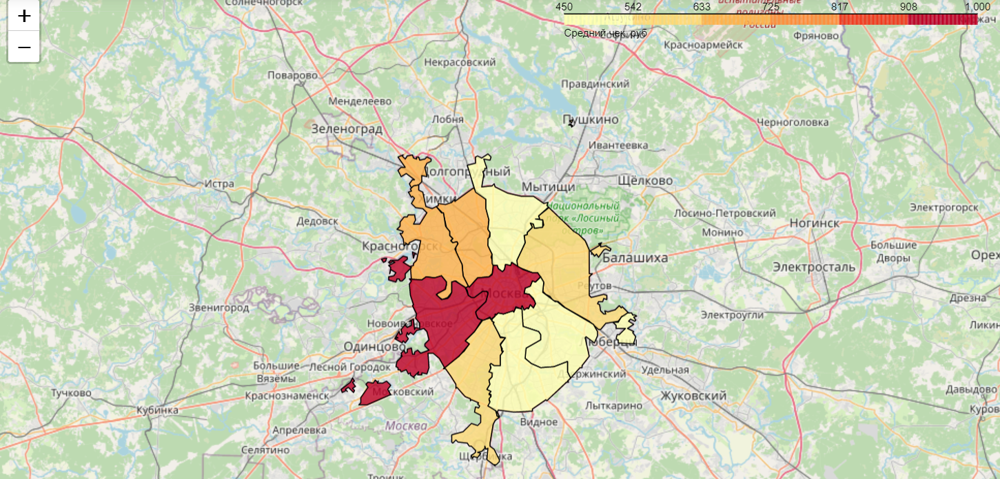

**Вывод:** Наглядно видно, что в центре и на западе Москвы питаться в заведения дороже всего (`Западный АО` и `Центральный АО`), здесь средний чек составляет примерно 1000 руб. Дешевле всего на юге, юго-востоке и северо-востоке столицы (`Северо-Восточный АО`, `Южный АО`, `Юго-Восточный АО`), средний чек в два раза меньше, 450-500 руб. В остальных районах средний чек колеблется в диапазоне от 575 до 700 рублей. Очевидно, что чем дальше мы отдаляемся от центра столицы, тем дешевле можно поесть в заведении.

### Дополнительные взаимосвязи

#### Исследуем заведения, работающие круглосуточно

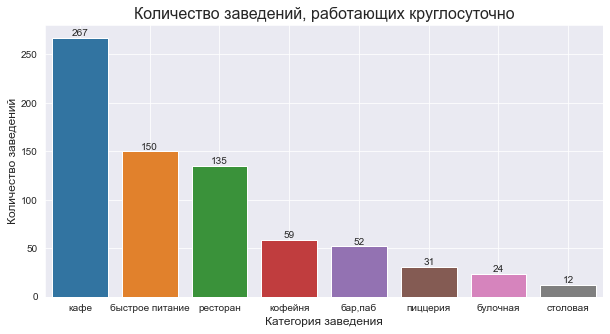

In [44]:
df_is_24 = df[df['is_24/7']]

fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x='index',
                 y='category',
                 data=df_is_24['category'].value_counts().reset_index())
plt.title('Количество заведений, работающих круглосуточно', fontsize=16)
plt.xlabel('Категория заведения', fontsize=12)
ax.bar_label(ax.containers[0])
plt.ylabel('Количество заведений', fontsize=12)
plt.grid()
plt.show()

In [45]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
#df_is_24.apply(create_clusters, axis=1)

#m

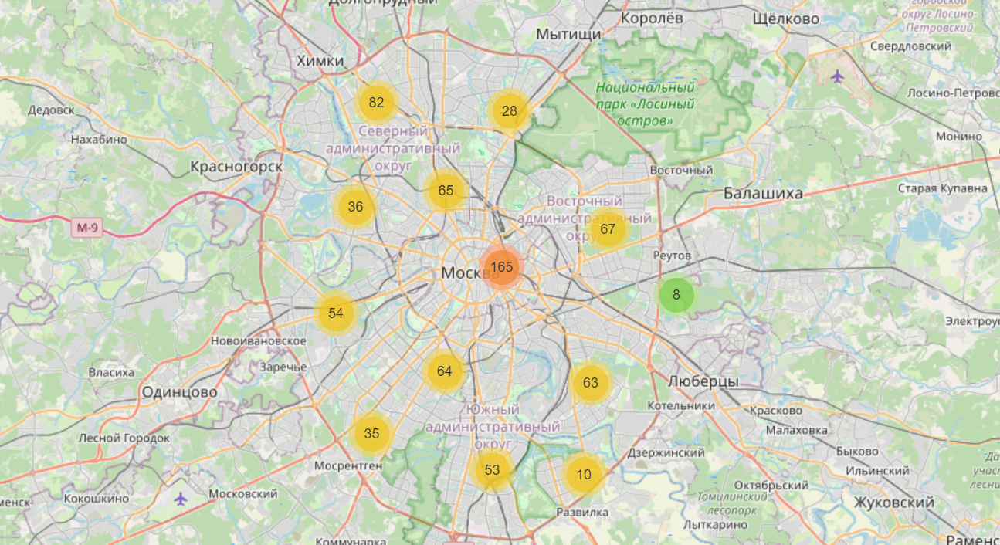

Круглосуточно работают преимущественно кафе (267) в центре Москвы, также ночью можно поесть в заведениях быстрого питания (150). Что интересно немало ресторанов (137) также работают круглосуточно, возможно это связано с ошибками в категориях заведений.

#### Изучим, какие заведения работают дольше всего

In [46]:
search_for = ['02:00', '03:00', '04:00']
df_night = df[df['hours'].str.contains('|'.join(search_for)) == True]

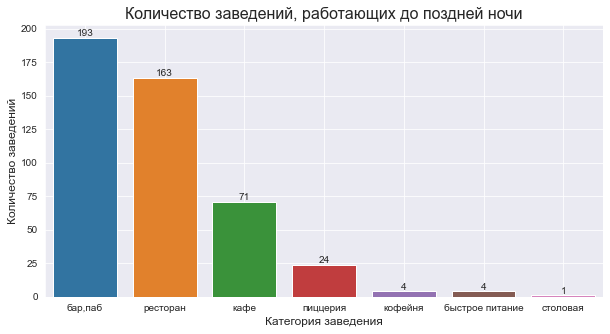

In [47]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x='index',
                 y='category',
                 data=df_night['category'].value_counts().reset_index())
plt.title('Количество заведений, работающих до поздней ночи', fontsize=16)
plt.xlabel('Категория заведения', fontsize=12)
ax.bar_label(ax.containers[0])
plt.ylabel('Количество заведений', fontsize=12)
plt.grid()
plt.show()

До 2-4 ночи работают бары-пабы и рестораны.

#### Особенности заведений с высоким рейтингом

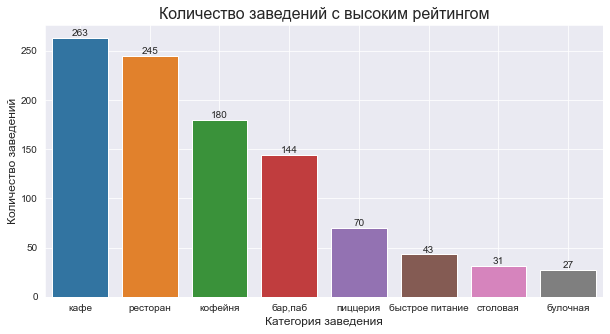

In [49]:
df_high_rating = df[df['rating'] >= 4.7]

fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x='index',
                 y='category',
                 data=df_high_rating['category'].value_counts().reset_index())
plt.title('Количество заведений с высоким рейтингом', fontsize=16)
plt.xlabel('Категория заведения', fontsize=12)
ax.bar_label(ax.containers[0])
plt.ylabel('Количество заведений', fontsize=12)
plt.grid()
plt.show()

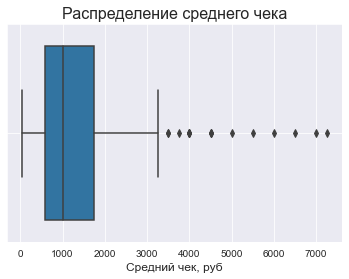

In [50]:
fig, ax = plt.subplots()
ax = sns.boxplot(x='middle_avg_bill', data=df_high_rating)
plt.title('Распределение среднего чека', fontsize=16)
plt.xlabel('Средний чек, руб', fontsize=12)
plt.grid()
plt.show()

Нам не удалось выявить особенностей заведений с высоким рейтингом, распределение категорий и средний чек не изменились при отсеивании заведений с рейтингом ниже 4,7.

#### Особенности заведений с низким рейтингом

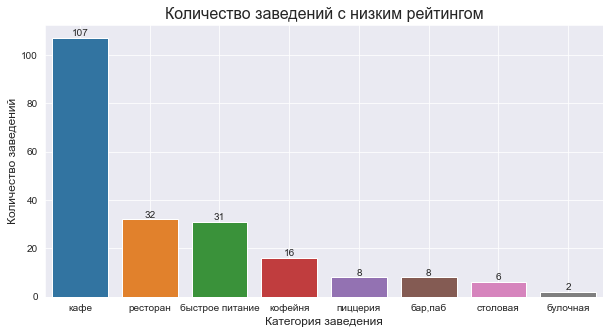

In [51]:
df_low_rating = df[df['rating'] < 3.0]

fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(x='index',
                 y='category',
                 data=df_low_rating['category'].value_counts().reset_index())
plt.title('Количество заведений с низким рейтингом', fontsize=16)
plt.xlabel('Категория заведения', fontsize=12)
ax.bar_label(ax.containers[0])
plt.ylabel('Количество заведений', fontsize=12)
plt.grid()
plt.show()

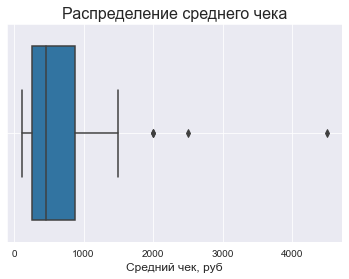

In [52]:
fig, ax = plt.subplots()
ax = sns.boxplot(x='middle_avg_bill', data=df_low_rating)
plt.title('Распределение среднего чека', fontsize=16)
plt.xlabel('Средний чек, руб', fontsize=12)
plt.grid()
plt.show()

При изучении заведений с низким рейтингом особенности получилось выявить. Подавляющее большинство таких заведений - кафе, что интересно с низким средним чеком - около 500 руб. Даже низкие цены здесь не радуют посетителей, видимо есть серьезные проблемы в работе таких заведений.

**Вывод по анализу рынка общепита в Москве:**
1. Больше всего заведений в Москве относятся к категории `кафе и рестораны`. На третьем месте `кофейни`. Меньше всего булочных и столовых.
2. В среднем `больше всего посадочных мест` в `ресторанах, барах-пабах и кофейнях` (> 80 мест). Меньше всего посадочных мест в кафе, пиццериях и булочных (<= 60 мест).
3. 62% заведений Москвы - `несетевые`.
4. `Булочные, пиццерии и кофейни` чаще являются `сетевыми`, чем несетевыми заведениями.
5. Топ-3 популярных заведений Москвы: `Шоколадница, Домино'с Пицца и Додо Пицца`. Самые `успешные сети - это кофейни и пиццерии`.
6. Больше всего заведений в `центре` столицы (2241 заведение). В остальных районах завдений в 2-3 раза меньше, от 700 до 900 заведений. Меньше всего в Северо-Западном - 409 заведений.
7. Рестораны на первом месте по популярности только в Центральном административном округе. В остальных районах на первом месте кафе. Кофейни стабильно находятся на третьем месте во всех округах Москвы.
8. Следует выделить категорию `бар,паб` с самой высокой средней оценкой 4,4. Кафе и быстрое питание имеют среднюю оценку 4,2, все остальные категории 4,3.
9. Категория `быстрое питание`  больше всего подвержена `отрицательным отзывам`.
10. В центре города заведения получают рейтинг выше, Центральный АО - самый высокий рейтинг (4,4).
11. Больше всего заведений на проспекте Мира (182), далее с заметным отставанием Профсоюзная улица (122), проспект Вернадского (108) и Ленинский проспект(107). 
12. Можно сказать, что если на улице находится лишь одно заведение, в большинстве случаев это будет кафе (в 2 раза меньше вероятность, что это будет ресторан или кофейня) со средней категорией цен, вместимостью 30-80 человек и со средним чеком в 625 рублей.
13. `В центре и на западе` Москвы питаться в заведения `дороже всего` (Западный АО и Центральный АО), здесь средний чек составляет примерно 1000 руб. Дешевле всего на юге, юго-востоке и северо-востоке столицы (Северо-Восточный АО, Южный АО, Юго-Восточный АО), средний чек в два раза меньше, 450-500 руб. В остальных районах средний чек колеблется в диапазоне от 575 до 700 рублей.
14. `Круглосуточно` работают преимущественно `кафе` (267) в центре Москвы, также ночью можно поесть в заведениях быстрого питания (150).
15. До 2-4 ночи работают бары-пабы и рестораны также преимущественно в центре столицы.
16. Подавляющее большинство заведений с `низким рейтингом` - `кафе`, с низким средним чеком - около 500 руб.


## Открытие кофейни

In [53]:
df_coffee = df[df['category'] == 'кофейня']

In [54]:
df_coffee.shape[0]

1413

In [55]:
round(df_coffee.shape[0] / df.shape[0] * 100, 1)

16.8

In [56]:
df_coffee_district = (
    df_coffee.groupby('district', as_index=False)
    .agg({'name':'count'})
    .sort_values('name', ignore_index=True, ascending=False)
)
df_coffee_district

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [57]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#Choropleth(
#    geo_data=state_geo,
#    data=df_coffee_district,
#    columns=['district', 'name'],
#    key_on='feature.name',
#    fill_color='PuRd',
#    fill_opacity=0.8,
#    legend_name='Количество кофеен',
#).add_to(m)

#m

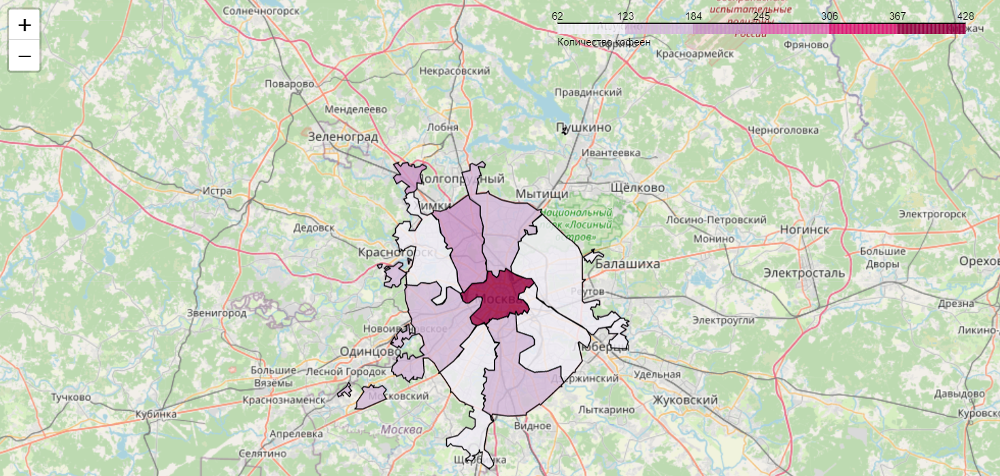

Всего в датасете 1413 кофеен, это 17% от всех заведений Москвы. Подавляющее большинство находятся центре столицы в `Центральном АО` (428), в 2 раза меньше на севере в `Северном АО`, в 3 раза меньше в `Северо-восточном АО`. Меньше всего кофеен в `Северо-западном АО`. В остальных районах наблюдается около 100 кофеен на каждый.

In [58]:
df_coffee[df_coffee['is_24/7']].shape[0]

59

In [59]:
round(df_coffee[df_coffee['is_24/7']].shape[0] / df_coffee.shape[0] * 100, 1)

4.2

In [60]:
(
    df_coffee[df_coffee['is_24/7']]
    .groupby('district', as_index=False)
    .agg({'name':'count'})
    .sort_values('name', ignore_index=True, ascending=False)
)

,district,name
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [61]:
df_coffee[df_coffee['is_24/7']]['rating'].describe()

count    59.000000
mean      4.206780
std       0.386792
min       2.300000
25%       4.100000
50%       4.200000
75%       4.350000
max       5.000000
Name: rating, dtype: float64

Круглосуточных кофеен всего 59 штук - это 4% от всех кофеен. И большинство из них в центре города. Изучив рейтинг этих кофеен нельзя сказать, что у них оценки выше остальных кофеен. Поэтому можно предположить, что круглосуточная работа кофейни - невостребованная ниша.

In [62]:
df_coffee['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

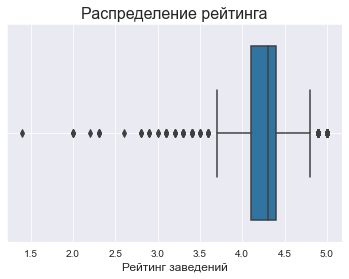

In [63]:
fig, ax = plt.subplots()
ax = sns.boxplot(x='rating', data=df_coffee)
plt.title('Распределение рейтинга', fontsize=16)
plt.xlabel('Рейтинг заведений', fontsize=12)
plt.grid()
plt.show()

In [64]:
(
    df_coffee.groupby('district', as_index=False)
    .agg({'rating':'median'})
    .sort_values('rating', ignore_index=True, ascending=False)
)

,district,rating
0,Восточный административный округ,4.3
1,Северный административный округ,4.3
2,Северо-Восточный административный округ,4.3
3,Северо-Западный административный округ,4.3
4,Центральный административный округ,4.3
5,Юго-Восточный административный округ,4.3
6,Юго-Западный административный округ,4.3
7,Южный административный округ,4.3
8,Западный административный округ,4.2


Оценки по всем районам примерно одинаковые, медианный рейтинг кофеен - 4,3.

In [65]:
df_coffee['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Здесь также присутствуют выбросы, следовательно, в качестве описательной статистики стоит использовать медиану, построить boxplot.

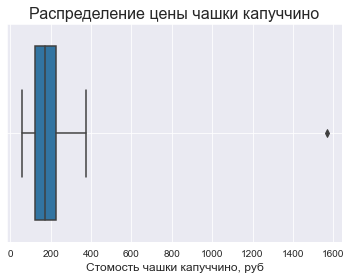

In [66]:
fig, ax = plt.subplots()
ax = sns.boxplot(x='middle_coffee_cup', data=df_coffee)
plt.title('Распределение цены чашки капуччино', fontsize=16)
plt.xlabel('Стомость чашки капуччино, руб', fontsize=12)
plt.grid()
plt.show()

In [67]:
df_coffee_cup = (
    df_coffee.groupby('district', as_index=False)
    .agg({'middle_coffee_cup':'median'})
    .sort_values('middle_coffee_cup', ignore_index=True, ascending=False)
)
df_coffee_cup

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [68]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#Choropleth(
#    geo_data=state_geo,
#    data=df_coffee_cup,
#    columns=['district', 'middle_coffee_cup'],
#    key_on='feature.name',
#    fill_color='GnBu',
#    fill_opacity=0.8,
#    legend_name='Медианная стоимость чашки капуччино, руб',
#).add_to(m)

#m

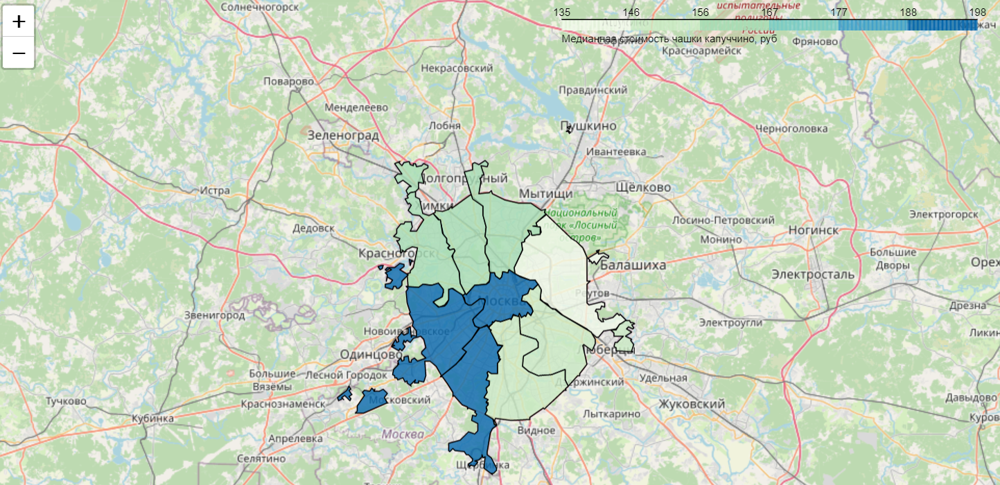

Средняя стоимость чашки капуччино сильно зависит от района Москвы. Самая дорогие кофейни в `Юго-западном АО`, `Центральном АО` и `Западном АО` (198, 190 и 189 руб.), дешевле всего в `Восточном АО` (135 руб.)

In [69]:
# Посмотрим какой режим работы лучше выбрать
df_coffee_hours = df_coffee['hours'].value_counts().reset_index().head()
# Изучим каждый режим работы по медианному рейтингу
df_coffee_hours['rating'] = df_coffee_hours['index'].apply(lambda x: df_coffee[df_coffee['hours'] == x]['rating'].median())
df_coffee_hours

,index,hours,rating
0,"ежедневно, 10:00–22:00",140,4.2
1,"ежедневно, 08:00–22:00",60,4.3
2,"ежедневно, круглосуточно",59,4.2
3,"ежедневно, 09:00–22:00",57,4.3
4,пн-пт 08:00–19:00,46,4.1


In [70]:
# Выясним на сколько большое помещение необходимо для открытия кофейни
df_coffee['seats'].describe()

count     751.000000
mean      111.199734
std       127.837772
min         0.000000
25%        40.000000
50%        80.000000
75%       144.000000
max      1288.000000
Name: seats, dtype: float64

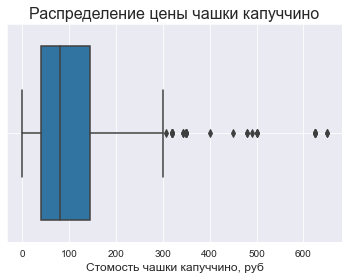

In [71]:
fig, ax = plt.subplots()
ax = sns.boxplot(x='seats', data=df_coffee[df_coffee['seats'] < 1000])
plt.title('Распределение цены чашки капуччино', fontsize=16)
plt.xlabel('Стомость чашки капуччино, руб', fontsize=12)
plt.grid()
plt.show()

In [72]:
# Посмотрим бывают ли хорошие оценки у маленьких кофеен
df_coffee[df_coffee['seats'] < 40]['rating'].median()

4.4

Самый популярный режим работы кофеен - ежедневно, 10:00–22:00. В среднем вместимость кофеен составляет 80 мест, однако у маленьких кофеен (меньше 40 мест) понижение среднего рейтинга не обнаружено.

**Рекомендации по открытию нового заведения:**
1. Открытие `кофейни` является целесообразным решением. Как мы выяснили, самые популярные заведения в Москве - это кафе, рестораны и кофейни. Однако открытие кофейни требует меньших капитальных вложений, в работе такого заведения меньше факторов риска.
2. Для открытия кофейни я бы рекомендовал рассмотреть `Юго-Западный АО.` Именно в этом районе Москвы наблюдается самая высокая средняя цена чашки кофе и при этом конкуренция здесь намного ниже, чем в центре столицы. Также арендная плата вероятно здесь будет ниже, однако стоит отметь, что необходимо дополнительно изучать проходимость мест.
3. Оптимальный режим работы - `ежедневно, с 8 или 9 часов и до 22 часов.`    Необходимости работать круглосуточно не выявлено, именно кофейни, работающие с 8 и 9 утра имеют рейтинг выше, возможно жаворонки недовольны, тем что некоторые кофейни работают только с 10 часов.
4. Рекомендую выбрать `небольшое помещение`, как можно ближе к такой инфраструктуре как парки или бизнес-центры.  Исследование показало, что кофейни с малой вместимостью тоже имеют высокий рейтинг. Возможно целесообразней выбрать помещение с меньшей вместимстью, следовательно, меньше арендной платой, и люди будут брать кофе с собой.
5. При открытие стоит ориентироваться на стоимость чашки капуччино в районе `170-190 руб.` Мы выяснили, что средняя стоимость чашки в `Юго-Западный АО` 198 руб (а по Москве в целом 170 руб). Чтобы эффективно конкурировать и зайти на рынок с лучшим предложением следует немного снизить цену, а в дальнейшем, возможно, получится ее поднять до 200 руб.

## Презентация

Презентация: https://disk.yandex.ru/i/nY-NWbYgy4AevQ

## Общий вывод

В результате проведенного исследования мы проанализировали рынок общепита в Москве и дали ряд рекомендаций.

**Вывод по анализу рынка общепита в Москве:**
1. Больше всего заведений в Москве относятся к категории `кафе и рестораны`. На третьем месте `кофейни`. Меньше всего булочных и столовых.
2. В среднем `больше всего посадочных мест` в `ресторанах, барах-пабах и кофейнях` (> 80 мест). Меньше всего посадочных мест в кафе, пиццериях и булочных (<= 60 мест).
3. 62% заведений Москвы - `несетевые`.
4. `Булочные, пиццерии и кофейни` чаще являются `сетевыми`, чем несетевыми заведениями.
5. Топ-3 популярных заведений Москвы: `Шоколадница, Домино'с Пицца и Додо Пицца`. Самые `успешные сети - это кофейни и пиццерии`.
6. Больше всего заведений в `центре` столицы (2241 заведение). В остальных районах завдений в 2-3 раза меньше, от 700 до 900 заведений. Меньше всего в Северо-Западном - 409 заведений.
7. Рестораны на первом месте по популярности только в Центральном административном округе. В остальных районах на первом месте кафе. Кофейни стабильно находятся на третьем месте во всех округах Москвы.
8. Следует выделить категорию `бар,паб` с самой высокой средней оценкой 4,4. Кафе и быстрое питание имеют среднюю оценку 4,2, все остальные категории 4,3.
9. Категория `быстрое питание`  больше всего подвержена `отрицательным отзывам`.
10. В центре города заведения получают рейтинг выше, Центральный АО - самый высокий рейтинг (4,4).
11. Больше всего заведений на проспекте Мира (182), далее с заметным отставанием Профсоюзная улица (122), проспект Вернадского (108) и Ленинский проспект(107). 
12. Можно сказать, что если на улице находится лишь одно заведение, в большинстве случаев это будет кафе (в 2 раза меньше вероятность, что это будет ресторан или кофейня) со средней категорией цен, вместимостью 30-80 человек и со средним чеком в 625 рублей.
13. `В центре и на западе` Москвы питаться в заведения `дороже всего` (Западный АО и Центральный АО), здесь средний чек составляет примерно 1000 руб. Дешевле всего на юге, юго-востоке и северо-востоке столицы (Северо-Восточный АО, Южный АО, Юго-Восточный АО), средний чек в два раза меньше, 450-500 руб. В остальных районах средний чек колеблется в диапазоне от 575 до 700 рублей.
14. `Круглосуточно` работают преимущественно `кафе` (267) в центре Москвы, также ночью можно поесть в заведениях быстрого питания (150).
15. До 2-4 ночи работают бары-пабы и рестораны также преимущественно в центре столицы.
16. Подавляющее большинство заведений с `низким рейтингом` - `кафе`, с низким средним чеком - около 500 руб.


**Рекомендации по открытию нового заведения:**
1. Открытие `кофейни` является целесообразным решением.  Как мы выяснили, самые популярные заведения в Москве - это кафе, рестораны и кофейни. Однако открытие кофейни требует меньших капитальных вложений, в работе такого заведения меньше факторов риска.
2. Для открытия кофейни я бы рекомендовал рассмотреть `Юго-Западный АО.` Именно в этом районе Москвы наблюдается самая высокая средняя цена чашки кофе и при этом конкуренция здесь намного ниже, чем в центре столицы. Также арендная плата вероятно здесь будет ниже, однако стоит отметь, что необходимо дополнительно изучать проходимость мест.
3. Оптимальный режим работы - `ежедневно, с 8 или 9 часов и до 22 часов.` Необходимости работать круглосуточно не выявлено, именно кофейни, работающие с 8 и 9 утра имеют рейтинг выше, возможно жаворонки недовольны, тем что некоторые кофейни работают только с 10 часов.
4. Рекомендую выбрать `небольшое помещение`, как можно ближе к такой инфраструктуре, как парки или бизнес-центры. Исследование показало, что кофейни с малой вместимостью тоже имеют высокий рейтинг. Возможно целесообразней выбрать помещение с меньшей вместимостью, следовательно, меньше арендной платой, и люди будут брать кофе с собой.
5. При открытие стоит ориентироваться на стоимость чашки капуччино в районе `170-190 руб.` Мы выяснили, что средняя стоимость чашки в `Юго-Западный АО` 198 руб (а по Москве в целом 170 руб). Чтобы эффективно конкурировать и зайти на рынок с лучшим предложением следует немного снизить цену, а в дальнейшем, возможно, получится ее поднять до 200 руб.